# High-Level Table of Contents

1. Introduction and Overall Objective
2. The Data
3. Sprint 1 - Exploratory Data Analysis
4. Sprint 2 - Variable Importance Analysis
5. Sprint 3 - Prediction
6. Overall Business Implications

# Introduction and Overall Objective

Loan Financing companies across various business categories such as fintech, automobile and 
housing are interested in understanding the interactions between a customer’s credit profile and 
their corresponding behaviors. Such an understanding will better place these companies to select 
the best customers to offer and/or grant loans.

Gringotts Financial, a hypothetical Lending and Financing company, would 
like to better understand customer tendencies to default on loans in their loan financing program.
The Analytics team will be examining historical data to understand what factors most affect loan 
defaults.

Stakeholders are interested in better understanding the data they have, to help inform decisions 
related to granting loans in the future. They would also like to understand which customers are 
most and least likely to default on loan repayments.

## Research Questions

1. What factors most tend to affect loan default?
2. Are any of the above factors positively correlated to one another? Negatively?
3. After building the predictive model, what profile of customers would you suggest we target for loan offers?

# The Data

Find below the description of each variable name in the dataset.

Data Source: https://www.kaggle.com/datasets/laotse/credit-risk-dataset

| Variable Name | Variable Description   |
|------|------|
|   person_age (years)  | The age of the applicant|
| person_income (USD) | The annual income of the applicant |
| person_home_ownership | The applicant's home ownership status |
| person_emp_length (years) | The applicant's employment length |
| loan_intent | What the applicant intends to do with the loan |
| loan_grade | The applicant's loan grade |
| loan_amnt (USD) | The loan amount granted to applicant |
| loan_int_rate | The loan interest rate |
| loan_percent_income | The percent of the applicant's income that is equal to the loan amount |
| cb_person_default_on_file (Y, N) | Whether or not the applicant has a credit bureau default on file |
| cb_person_cred_hist_length (years) | The credit bureau's record of the applicant's credit history length |
| loan_status (0, 1) | Loan status (0 is non default 1 is default) |

# Library & Function Organization

## Libraries

In [1]:
# Sprint 1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import sqlite3 as sql

# Sprint 2
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency as chi
from scipy.stats import pointbiserialr as pbr

# Sprint 3
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import sklearn.metrics as mtrx
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, accuracy_score, ConfusionMatrixDisplay
from sklearn.tree import plot_tree
import graphviz
from sklearn.tree import export_graphviz

## Functions
It is good practice to write functions that will enable ease of project execution and avoid repetition.

In [2]:
# Sprint 1


def get_dtypes_df(df):
    '''
    Returns - dataframe's column names and their data types
    in its own dataframe
    Args - df: dataframe object
    '''
    dtypes_df = pd.DataFrame(df.dtypes).rename(columns = {0: "Dtype"})
    return dtypes_df

def get_num_dtypes_df(df, dtypes_df):
    '''
    Returns - thoroughly filtered dtypes_df 
    including only numerical variable columns
    Args - df: dtypes_df dataframe object
    '''
    num_dtypes_df = dtypes_df[(dtypes_df.Dtype != "object")]

    # remove categorical with dummy variables
    for col in num_dtypes_df.index:
        if list(df[col].unique()) == [1,0] or list(df[col].unique()) == [0,1]:
            print(f"{col} column was removed.")
            num_dtypes_df = num_dtypes_df.drop(col, axis = 0)
    return num_dtypes_df

def get_cat_dtypes_df(df, dtypes_df):
    '''
    Returns - thoroughly filtered dtypes_df 
    including only categorical variable columns
    Args - df: dtypes_df dataframe object
    '''
    categorical = []
    for col in dtypes_df.index:
        if list(df[col].unique()) == [1,0] or list(df[col].unique()) == [0,1]:
            categorical.append(col)
    for i in dtypes_df[dtypes_df['Dtype'] == "object"].index:
        categorical.append(i)
    return dtypes_df.loc[categorical]

def query(sql_query):
    '''
    Returns dataframe based on written SQL query
    '''
    return pd.read_sql(sql_query, conn)

def vbar(data, xlabel, ylabel = 'Count', col = "", title = ""):
    '''
    Returns vertical count bar chart
    '''
    sns.countplot(data = data, x = col, order = data[col].value_counts().index, 
                  color = 'grey').set_title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel);

def hbar(data, ylabel, xlabel = 'Count', col = "", title = ""):
    '''
    Returns horizontal count bar chart
    '''
    sns.countplot(data = data, y = col, order = data[col].value_counts().index, 
                  color = 'grey').set_title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel);
    

# Sprint 2


def get_crosstabs(dataframe, categorical):
    # Create empty list for each crosstab 
    crosstabs = []
    for i in categorical:
        for j in range(len(categorical)):
            crosstabs.append(pd.crosstab(index = CreditData[i], 
                                         columns = [CreditData[categorical[j]]]))
    return crosstabs


def chi_square_results(crosstabs, dataframe):
    '''
    Returns - Dataframe of important chi-square results:
    Row name, Column Name, Chi-square test statistic, p-value and degrees of freedom
    '''
    # Create empty lists for each crosstab column name and each crosstab row name
    col_names = []
    row_names = []

    # Create empty lists for Row name, Column Name, 
                            # test statistic, p-value and degrees of freedom
    columns = []
    rows = []
    x2= []
    p = []
    df = []
    cramers_v = []

    # Iterate through each categorical column in CreditData. 
    # Create crosstabs for a column against itself and every other column.
    # Append them to crosstabs list.
    # Also append the row and column names in each crosstab to their respective lists
    for i in categorical:
        for j in range(len(categorical)):
            col_names.append(categorical[j])
            row_names.append(i)

    # Iterate through each crosstab index and append each 
    # individual crosstab's results into respective lists including:
    # Row name, Column name, chi-square test statistic, p-value and degrees of freedom
    # Finally, create a dictionary for each result variable and create a results dataframe to return.
    for k in range(len(crosstabs)):
        columns.append(col_names[k])
        rows.append(row_names[k])
        x2.append(chi(crosstabs[k])[0]),
        p.append(chi(crosstabs[k])[1]),
        df.append(chi(crosstabs[k])[2])
        cramers_v.append(round(np.sqrt((chi(crosstabs[k])[0]/len(dataframe))/min((len(crosstabs[k]) - 1, 
                                                                            len(crosstabs[k].columns) - 1))),3))

        results = {"Row name": rows,
                   "Column Name": columns,
                   "Test statistic": x2,
                   "p-value": p,
                   "df": df,
                  "cramers_v": cramers_v}
    results_dataframe = pd.DataFrame(results)
    results_dataframe = results_dataframe.set_index(['Row name'])
    for col in results_dataframe:
        results_dataframe = results_dataframe
    return results_dataframe

def get_pbr_result(dataframe, numerical, categorical_target):
    r = []
    p = []
    var_name = []
    for v in range(len(numerical)):
        r.append(pbr(CreditData[numerical[v]], CreditData[categorical_target])[0])
        p.append(pbr(CreditData[numerical[v]], CreditData[categorical_target])[1])
        var_name.append(numerical[v])
    pbr_result = pd.DataFrame({"Continuous Variable": var_name,
                               "Binomial Target Variable": categorical[0], 
                                "Point biserial R": r, 
                               "Absolute Point biserial R": np.absolute(r),
                                "p-value": p})
    return pbr_result

# Sprint 1 - Exploratory Data Analysis

## Sprint 1 Table of Contents

1. Objective
2. The Data
3. Library & Function Organization
    - Libraries
    - Functions
4. Data Cleaning
    - Data Types
    - Missing Values
    - Duplicate Records
    - Outliers
5. Exploratory Data Analysis
    - Set up SQL for Data Analysis
    - Numerical Variables
    - Categorical Variables
6. Detailed Exploratory Analysis
    - Default vs. No Default
    - Loan Default Rates, Interest Rates and Loan Grade
    - Stakeholder Question: Which customers are MOST & LEAST likely to default on loan repayments?
        - Age
        - Income
        - Employment Length
        - Credit History Length
        - Loan Default History
7. Summary & Business Implications
8. Next Steps - Variable Importance Analysis

## Sprint 1 Objective

Gringotts Financial, a hypothetical Lending and Financing company, would like to better understand customer tendencies to default on loans in their loan financing program.

In this Sprint, the Analytics team will be cleaning and exploring historical data as a baseline for further analyses in subsequent sprints.

Stakeholders are interested in a quick preliminary glimpse to understand which customers are MOST & LEAST likely to default on loan repayments based on visualizations from historical data.

## Data Cleaning

In [3]:
# Load data and quick look
CreditData = pd.read_csv("credit_risk_dataset.csv")
CreditData.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [4]:
# Get shape of data
CreditData.shape

(32581, 12)

### Data Types

In [5]:
CreditData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [6]:
# All data types
dtypes = get_dtypes_df(CreditData)
dtypes

,Dtype
person_age,int64
person_income,int64
person_home_ownership,object
person_emp_length,float64
loan_intent,object
loan_grade,object
loan_amnt,int64
loan_int_rate,float64
loan_status,int64
loan_percent_income,float64


Based on the column desriptions, all the data types look to be correctly assigned to each column.

In [7]:
# Numerical Data Types
num_dtypes = get_num_dtypes_df(CreditData, dtypes)
num_dtypes

loan_status column was removed.


,Dtype
person_age,int64
person_income,int64
person_emp_length,float64
loan_amnt,int64
loan_int_rate,float64
loan_percent_income,float64
cb_person_cred_hist_length,int64


In [8]:
# Categorical Data Types
cat_dtypes = get_cat_dtypes_df(CreditData, dtypes)
cat_dtypes

,Dtype
loan_status,int64
person_home_ownership,object
loan_intent,object
loan_grade,object
cb_person_default_on_file,object


### Missing Values

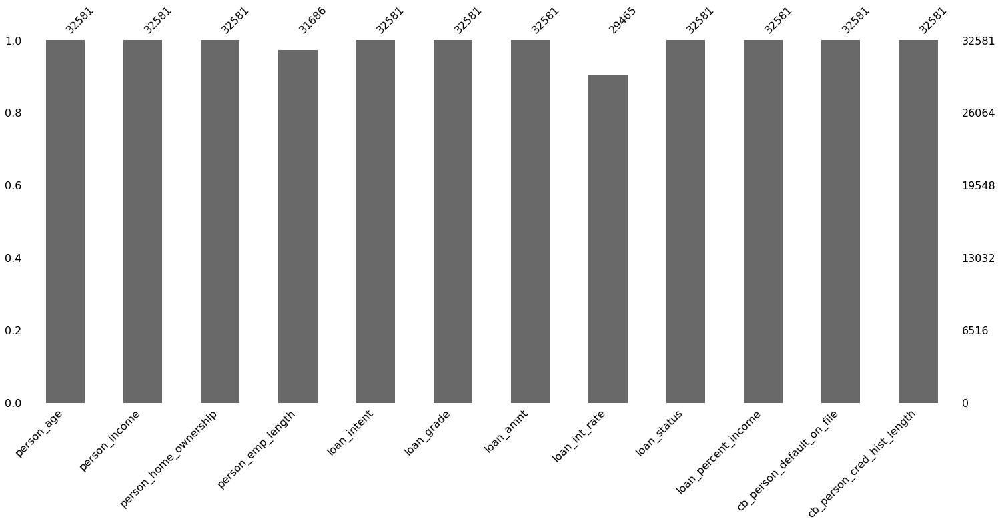

In [9]:
# Visualize Missing Values in bar graph
msno.bar(CreditData);

Two columns were found to have missing values: `person_emp_length` and `loan_int_rate`

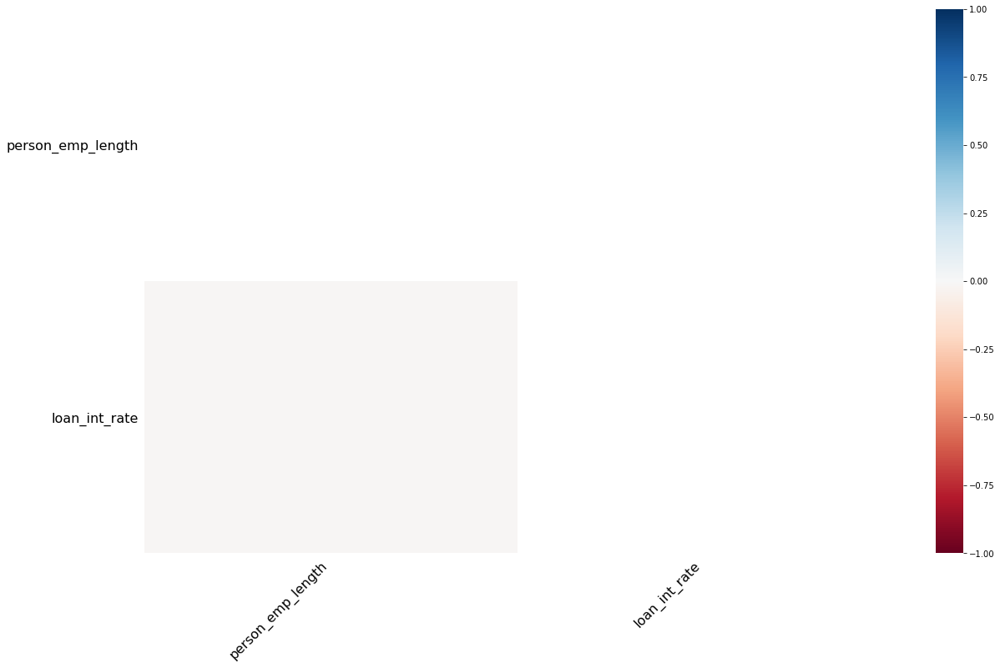

In [10]:
# Visualize Potential Relationship between missing value columns
msno.heatmap(CreditData);

As shown in the heatmap above, there is very little to no relationship between the columns with missing values. Hence, the actual amount of rows that are affected by missing values is GREATER than the number of rows affected by missing values from the column with more missing values - i.e GREATER than amount of `loan_int_rate` missing values.

In [11]:
# Amount of loan_int_rate null rows

loan_int_rate_null_rows = len(CreditData[CreditData['loan_int_rate'].isnull()])

print(f"The actual number of null rows is {loan_int_rate_null_rows}, which constitutes\
 {int(100*(loan_int_rate_null_rows/len(CreditData)))}% of the observations.")


# Amount of total rows

null_rows = len(CreditData[CreditData.isnull().any(axis=1)])
print(f"The actual number of null rows is {null_rows}, which constitutes\
 {int(100*(null_rows/len(CreditData)))}% of the observations.")

The actual number of null rows is 3116, which constitutes 9% of the observations.
The actual number of null rows is 3943, which constitutes 12% of the observations.


There are two possible ways missing values can be handled:
1. Delete all rows with missing values
2. Impute values based on statistical or machine learning methods.

For the purpose of clarity in explainability of approach, we opt to delete all rows with missing values. This means that we will be retaining ~88% of the original observations, or 28,638 of the original 32,581 observations.

In [12]:
# Drop Rows with Missing Values
CreditData = CreditData.dropna().reset_index(drop = True)

In [13]:
# Check shape again
CreditData.shape

(28638, 12)

As expected, we now have 28,638 rows in the dataset

### Duplicate Records
There is only one way of handling duplicate records. Delete them.

In [14]:
# Number of duplicated records
num_dupes = sum(CreditData.duplicated())

print(f"The number of non-null duplicated rows is {num_dupes}\
 which consitutes {round(100*(num_dupes/len(CreditData)), 2)}% of the observations.")

The number of non-null duplicated rows is 137 which consitutes 0.48% of the observations.


In [15]:
# Drop Duplicates
CreditData = CreditData.drop_duplicates().reset_index(drop = True)
print(f"{num_dupes} duplicate rows were deleted. The dataset now has {len(CreditData)} rows.")

137 duplicate rows were deleted. The dataset now has 28501 rows.


In [16]:
# Check Shape again
CreditData.shape

(28501, 12)

Again, as expected there are now 28,501 records in the dataset

### Outliers

Outliers, if not properly handled, can incorrectly skew our measures of central tendency (mean, mode, median), though the median would be negligibly affected for attributes with small variances. 

Boxplots are a great way to visualize the distribution of a numerical variable, as well as compare with a categorical variable to understand spread and median relationship across categories.
Here, we will do this with all numerical variables against the categorical variable `loan_status`

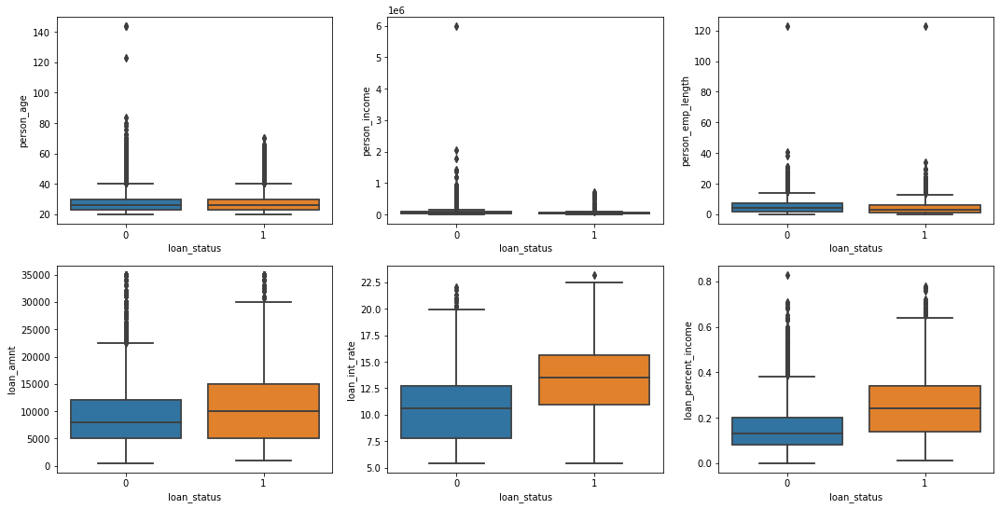

In [17]:
target_var = "cb_person_cred_hist_length"
rows = 2 
cols = 3 
figsize = (18,9)


fig, axs = plt.subplots(rows, cols, figsize=figsize)

y_lst = np.array(num_dtypes.drop(target_var, axis = 0).index).reshape(rows,cols)
for i in range(len(axs)):
    for j in range(len(axs[i])):
        for v in range(len(y_lst)):
            sns.boxplot(x = "loan_status", y = y_lst[i,j] , data = CreditData, ax = axs[i,j])

Looking at the above boxplots, we see that the medians Loan Interest Rate, Loan Percentage of income and Loan Amount are all higher for individuals that default. It is important to note that all 3 of these variables are directly within the control of GL financial. The trends for the Person Age, Person Income and Person Employment Length are difficult to decipher on the boxplot. Furthermore, there are clearly some incorrect outliers for person_age and person_emp_length. These rows will be removed from the dataset, after which we will check the distribution again.

In [18]:
CreditData = CreditData[(CreditData['person_age'] < 120) & (CreditData['person_emp_length'] < 120)]

# Check Shape again
CreditData.shape

(28495, 12)

The removal of incorrect outliers reduced our dataset by 6 records, down to 28,495 records. Let's take a look at the boxplots again.

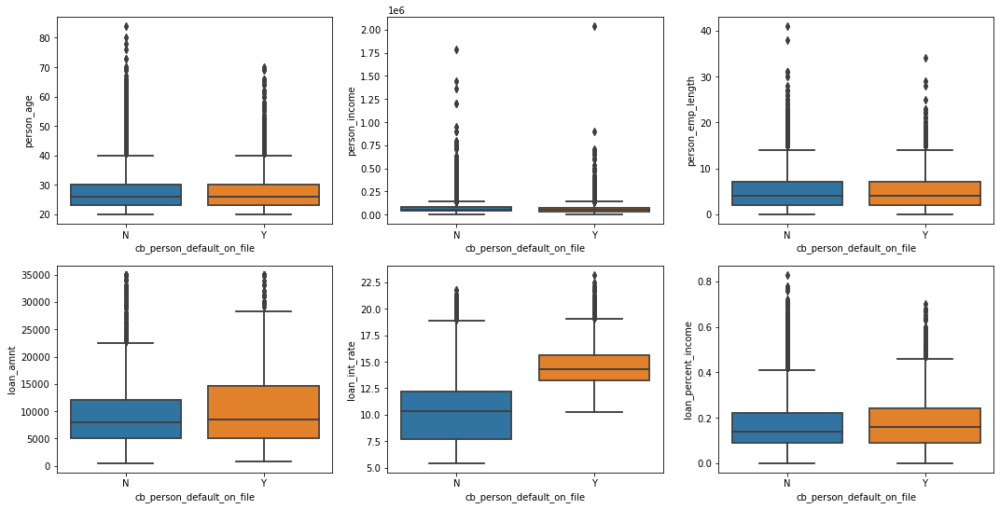

In [19]:
target_var = "cb_person_cred_hist_length"
rows = 2 
cols = 3 
figsize = (18,9)


fig, axs = plt.subplots(rows, cols, figsize=figsize)

y_lst = np.array(num_dtypes.drop(target_var, axis = 0).index).reshape(rows,cols)
for i in range(len(axs)):
    for j in range(len(axs[i])):
        for v in range(len(y_lst)):
            sns.boxplot(x = "cb_person_default_on_file", y = y_lst[i,j] , data = CreditData, ax = axs[i,j])

The above distributions looks safer for our measures of central tendency. We can still see that person_income has some outliers. We will not remove those because it is perfectly possible for individual incomes to be that high.

## Exploratory Data Analysis

### Set up SQL for Data Analysis

In [20]:
conn = sql.connect("credit_risk_data.db")

In [21]:
CreditData.to_sql('CreditData', conn, if_exists = 'replace', index = False)

### Numerical Variables
In this section we will explore general relationships between numerical variables in our dataset. Two powerful visuals for accomplishing this are the pairplot and the correlation matrix. 
The pairplot shows individual distributions with density curves as well as scatterplots between numerical variables. 
The correlation matrix quantifies the strength and direction of correlation between numerical variables

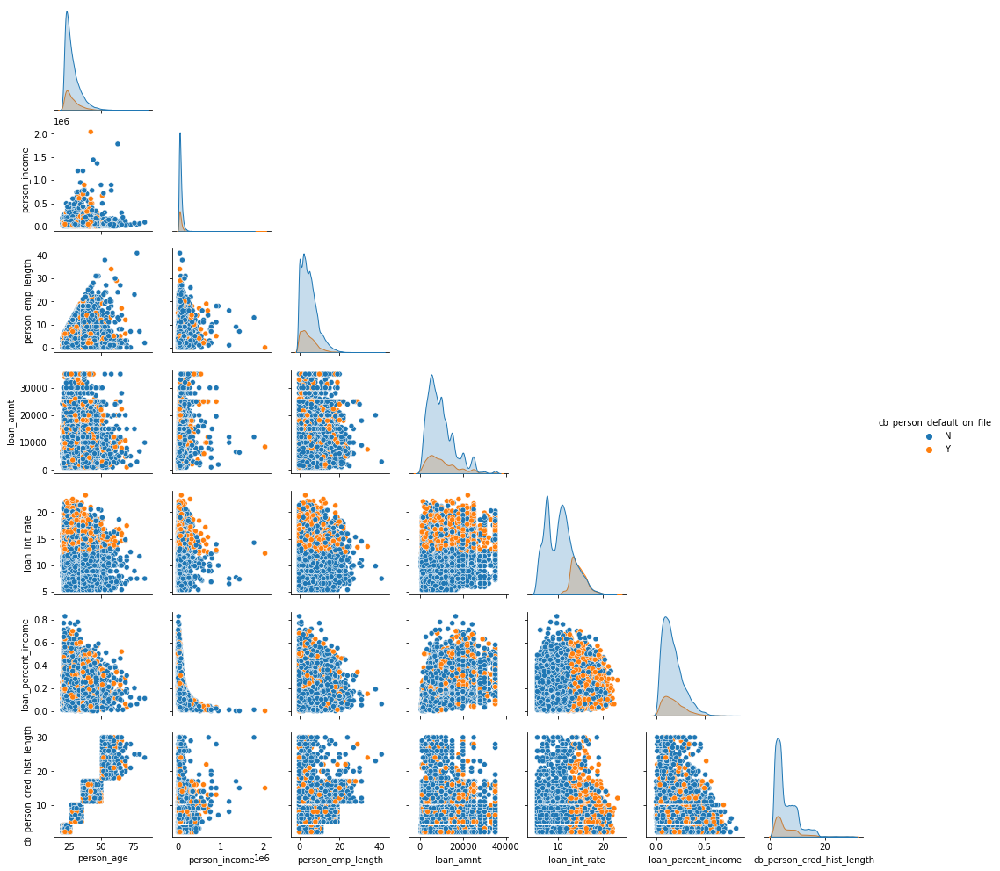

In [22]:
# Plot pairplot
sns.pairplot(data = CreditData.drop('loan_status', axis = 1), # Drop loan status as it has categorical dummy variables
             height = 2, 
             hue = "cb_person_default_on_file", 
             corner = True);

The pairplot above gives us information about the relationships between the numerical variables in our dataset. Clearly, we see that the higher default rates occurred mostly when a person received a high loan interest rate across all ages, incomes, employment lengths and loan amounts received. We also see this trend in the individual density distribution for `loan_int_rate`. Every other variable has relatively similar density distributions among customers with and without credit bureau defaults on file.

The cutoff `loan_int_rate` looks to be around 12.5%

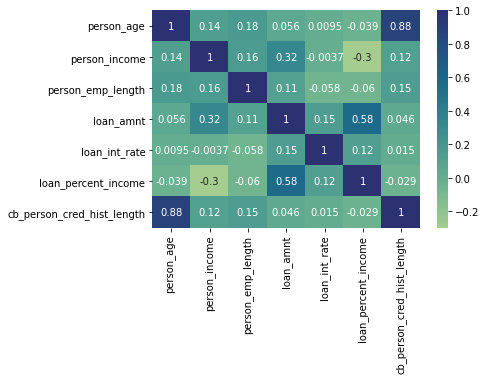

In [23]:
corr = CreditData.drop('loan_status', axis = 1).corr() # Drop loan status as it has categorical dummy variables

# Plot correlation matrix heatmap
sns.heatmap(corr, annot = True, cmap = "crest");

As seen in the correlation heatmap above, there is a very strong positive correlation between a Person's age and their credit history length. We also see this strength in the pairplot above. To avoid the negative effects multicollinearity on a regression model, we may consider removing one of these from the model if it is deemed insignificant to it.

### Categorical Variables
In this section we will explore categorical variables in our datasetand their relationships with the target variable. One  visual for accomplishing this is the bar graph/chart.
The bar chart shows counts within a category and can also have a multidimensional component displayed with color.

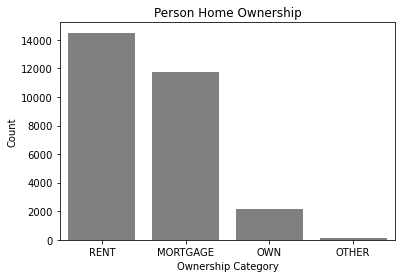

In [24]:
# Person Home Ownership
vbar(CreditData, 
        col = 'person_home_ownership',
       xlabel = 'Ownership Category',
       title = 'Person Home Ownership')

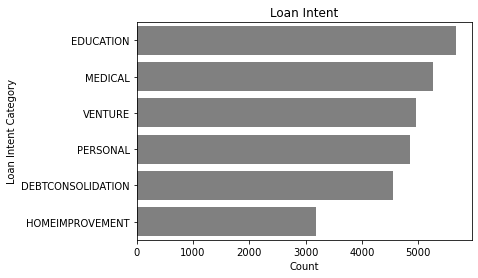

In [25]:
# Loan Intent
hbar(CreditData, 
        col = 'loan_intent',
       ylabel = 'Loan Intent Category',
       title = 'Loan Intent')

Education is the most prevalent loan intent.

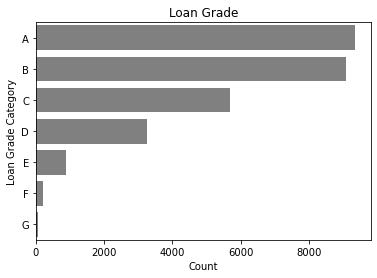

In [26]:
# Loan Grade
hbar(CreditData, 
        col = 'loan_grade',
       ylabel = 'Loan Grade Category',
       title = 'Loan Grade')

The vast majority of loans are Grade A and B loans, which are the safest

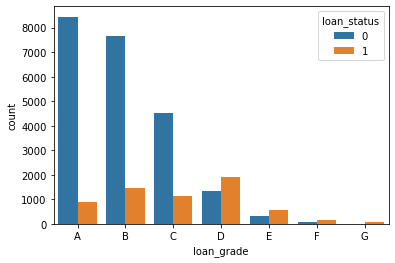

In [27]:
sns.countplot(data = CreditData, x="loan_grade", 
              order = CreditData["loan_grade"].value_counts().index, 
              hue= "loan_status");

## Detailed Exploratory Analysis
In this section, we will undergo a detailed exploratory analysis, during which we will explore which customers are least and most likely to default on loan repayments. We will you use the person information to accomplish this.

We will begin utilizing SQL for querying in this section.

### Default vs. No Default

In [28]:
loan_status_counts = [len(CreditData[CreditData['loan_status'] == 0]), 
 len(CreditData[CreditData['loan_status'] == 1])]
labels = ['No Default', 'Default']

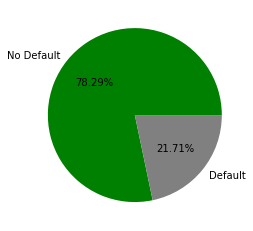

In [29]:
plt.pie(loan_status_counts, labels = labels, autopct='%.2f%%', colors = ['green', 'grey']);

We see that about 22% of all customers have defaults on their record

### Loan Default Rates, Interest Rates and Loan Grade

In [30]:
adr_air_lg = query(
'''
SELECT loan_grade, ROUND(AVG(loan_int_rate), 2) avg_int_rate, 
                    ROUND(100 * AVG(loan_status), 2) AS Loan_Default_Rate  
FROM CreditData
GROUP BY loan_grade
''')
adr_air_lg

,loan_grade,avg_int_rate,Loan_Default_Rate
0,A,7.35,9.61
1,B,11.00,15.93
2,C,13.45,20.33
3,D,15.35,59.22
4,E,17.00,64.67
5,F,18.60,69.86
6,G,20.25,98.31


In [31]:
# Default Rate Statistics Across Loan Grades
adr_air_lg['Loan_Default_Rate'].describe()

count     7.000000
mean     48.275714
std      33.366917
min       9.610000
25%      18.130000
50%      59.220000
75%      67.265000
max      98.310000
Name: Loan_Default_Rate, dtype: float64

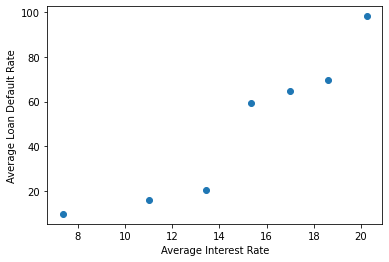

In [32]:
plt.scatter(x = adr_air_lg['avg_int_rate'], y = adr_air_lg['Loan_Default_Rate'])
plt.xlabel("Average Interest Rate")
plt.ylabel("Average Loan Default Rate");

On average, the higher the interest rate, the higher the loan default rate.

### Stakeholder Question: Which customers are MOST & LEAST likely to default on loan repayments?

Explore across Age, Income, Employment Length, Credit History Length and Loan Default History.

#### Age

In [33]:
age_freq = query(
'''
WITH cte AS
(
SELECT person_age, AVG(loan_int_rate) avg_int_rate, AVG(loan_status) AS Loan_Default_Rate,
        COUNT(person_age) AS age_count
FROM CreditData
--WHERE (loan_grade = "A" or loan_grade = "B" or loan_grade = "C" ) AND (loan_int_rate < 13.45)
GROUP BY person_age
)

SELECT 
        CASE 
        WHEN c.person_age BETWEEN 18 and 25 THEN "18-25"
        WHEN c.person_age BETWEEN 26 and 35 THEN "26-35"
        WHEN c.person_age > 35 THEN "Over 35" 
        END AS "Age Range",
        SUM(c.age_count) AS "Customer Count",
        ROUND((avg_int_rate), 1) AS "Average Interest Rate (%)",
        ROUND(100 * AVG(c.Loan_Default_Rate), 2) AS "Loan Default Rate (%)"
        
FROM cte c
GROUP BY 1
''')

age_freq["Customer Percentage (%)"] = round(100 * age_freq["Customer Count"]/np.sum(age_freq["Customer Count"]), 1)
age_freq

,Age Range,Customer Count,Average Interest Rate (%),Loan Default Rate (%),Customer Percentage (%)
0,18-25,13389,11.6,22.37,47.0
1,26-35,12099,11.0,20.43,42.5
2,Over 35,3007,11.3,20.28,10.6


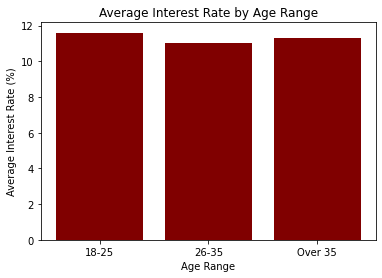

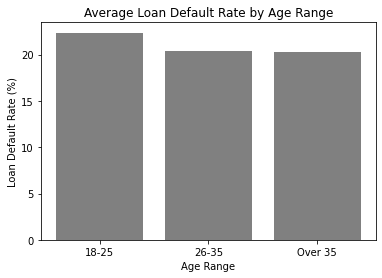

In [34]:
# Interest Rate
plt.bar(age_freq['Age Range'], age_freq['Average Interest Rate (%)'], color = 'maroon')
plt.xlabel('Age Range')
plt.ylabel('Average Interest Rate (%)')
plt.title ('Average Interest Rate by Age Range')
plt.show();

# Default Rate
plt.bar(age_freq['Age Range'], age_freq['Loan Default Rate (%)'], color = 'grey')
plt.xlabel('Age Range')
plt.ylabel('Loan Default Rate (%)')
plt.title ('Average Loan Default Rate by Age Range')
plt.show();

#### Income

In [35]:
income_freq = query('''

SELECT 
    CASE 
        WHEN c.person_income < 56000 THEN "Less than 56000"
        WHEN c.person_income BETWEEN 56000 and 80000 THEN "56000 - 80000"
        WHEN c.person_income > 80000 THEN "Over 80000"
        END AS "Income Range", 
    ROUND(AVG(c.loan_int_rate), 2) AS "Average Interest Rate (%)", 
    ROUND(100 *AVG(c.loan_status), 2) AS "Loan Default Rate (%)",
    COUNT(c.person_income) AS "Customer Count"
FROM CreditData c
GROUP BY 1
ORDER BY 3 DESC
''')

income_freq["Customer Percentage (%)"] = round(100 * income_freq["Customer Count"]/np.sum(income_freq["Customer Count"]), 1)
income_freq

,Income Range,Average Interest Rate (%),Loan Default Rate (%),Customer Count,Customer Percentage (%)
0,Less than 56000,11.14,30.21,14247,50.0
1,56000 - 80000,10.94,16.53,7441,26.1
2,Over 80000,10.96,9.59,6807,23.9


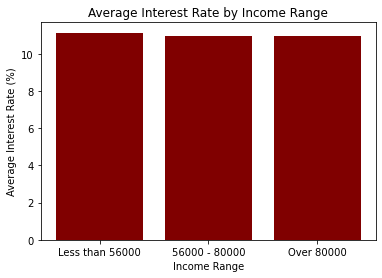

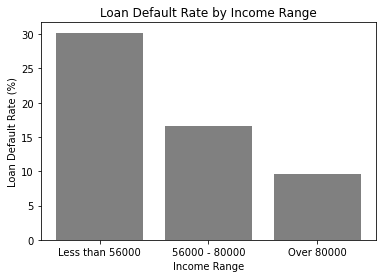

In [36]:
#Interest Rate
plt.bar(income_freq['Income Range'], income_freq['Average Interest Rate (%)'], color = 'maroon')
plt.xlabel('Income Range')
plt.ylabel('Average Interest Rate (%)')
plt.title ('Average Interest Rate by Income Range')
plt.show();

# Default Rate
plt.bar(income_freq['Income Range'], income_freq['Loan Default Rate (%)'], color = 'grey')
plt.xlabel('Income Range')
plt.ylabel('Loan Default Rate (%)')
plt.title ('Loan Default Rate by Income Range')
plt.show();

#### Employment Length

In [37]:

empl_length_freq = query('''
SELECT 
    CASE 
        WHEN c.person_emp_length BETWEEN 0 AND 4 THEN "Entry-level"
        WHEN c.person_emp_length BETWEEN 5 AND 9 THEN "Mid Senior Level"
        WHEN c.person_emp_length > 9 THEN "Senior Level"
        END AS "Employment Class",
    ROUND((c.loan_int_rate), 1) AS "Average Interest Rate (%)",
    ROUND(100 * AVG(c.loan_status), 2) AS "Loan Default Rate (%)",
    COUNT(c.person_emp_length) AS "Customer Count"
FROM CreditData c
GROUP BY 1
ORDER BY 3 DESC
''')


empl_length_freq["Customer Percentage"] = round(100 * empl_length_freq["Customer Count"]/np.sum(empl_length_freq["Customer Count"]), 1)
empl_length_freq

,Employment Class,Average Interest Rate (%),Loan Default Rate (%),Customer Count,Customer Percentage
0,Entry-level,12.9,24.88,15451,54.2
1,Mid Senior Level,11.1,18.53,9787,34.3
2,Senior Level,13.5,16.24,3257,11.4


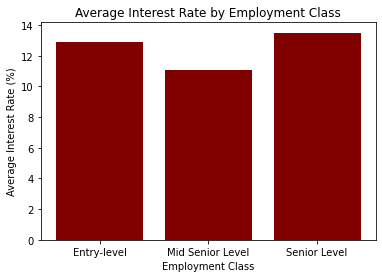

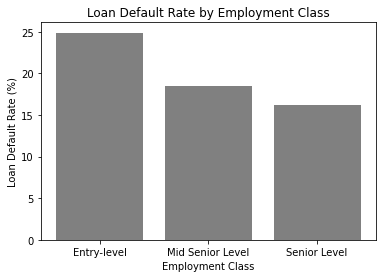

In [38]:
# Interest Rate
plt.bar(empl_length_freq['Employment Class'], empl_length_freq['Average Interest Rate (%)'], color = 'maroon')
plt.xlabel('Employment Class')
plt.ylabel('Average Interest Rate (%)')
plt.title ('Average Interest Rate by Employment Class')
plt.show();

# Default Rate
plt.bar(empl_length_freq['Employment Class'], empl_length_freq['Loan Default Rate (%)'], color = 'grey')
plt.xlabel('Employment Class')
plt.ylabel('Loan Default Rate (%)')
plt.title ('Loan Default Rate by Employment Class')
plt.show();

#### Credit History Length

In [39]:
cred_length_freq = query('''

SELECT 
    CASE 
        WHEN c.cb_person_cred_hist_length BETWEEN 0 AND 4 THEN "0-4 years"
        WHEN c.cb_person_cred_hist_length BETWEEN 5 AND 8 THEN "5-8 years"
        WHEN c.cb_person_cred_hist_length > 8 THEN "Greater than 8 years"
        END AS "Credit History Range",
        ROUND((loan_int_rate), 1) AS "Average Interest Rate (%)",
        ROUND(100 * AVG(c.loan_status), 2) AS "Loan Default Rate (%)",
        COUNT(c.cb_person_cred_hist_length) AS "Customer Count"
FROM CreditData c
GROUP BY 1
ORDER BY 4 DESC
''')

cred_length_freq["Customer Percentage"] = round(100 * cred_length_freq["Customer Count"]/np.sum(cred_length_freq["Customer Count"]), 1)
cred_length_freq

,Credit History Range,Average Interest Rate (%),Loan Default Rate (%),Customer Count,Customer Percentage
0,0-4 years,11.1,22.70,15577,54.7
1,5-8 years,7.5,20.30,6620,23.2
2,Greater than 8 years,8.5,20.75,6298,22.1


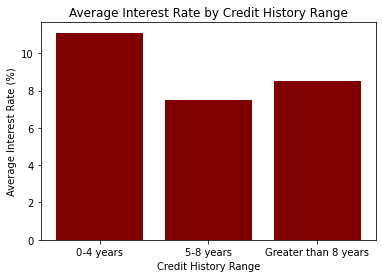

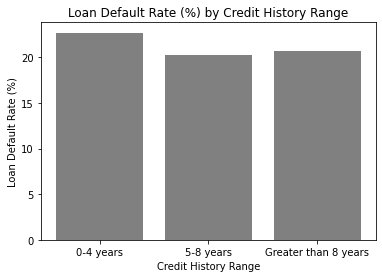

In [40]:
# Interest Rate
plt.bar(cred_length_freq['Credit History Range'], cred_length_freq['Average Interest Rate (%)'], color = 'maroon')
plt.xlabel('Credit History Range')
plt.ylabel('Average Interest Rate (%)')
plt.title ('Average Interest Rate by Credit History Range')
plt.show();

# Default Rate
plt.bar(cred_length_freq['Credit History Range'], cred_length_freq['Loan Default Rate (%)'], color = 'grey')
plt.xlabel('Credit History Range')
plt.ylabel('Loan Default Rate (%)')
plt.title ('Loan Default Rate (%) by Credit History Range')
plt.show();

#### Loan Default History

In [41]:
default_hist_freq = query('''

SELECT 
    cb_person_default_on_file AS "Default History?",
        ROUND((loan_int_rate), 1) AS "Average Interest Rate (%)",
        ROUND(100 * AVG(c.loan_status), 2) AS "Loan Default Rate (%)",
        COUNT(c.cb_person_default_on_file) AS "Customer Count"
FROM CreditData c
GROUP BY 1
ORDER BY 3 DESC
''')

default_hist_freq["Customer Percentage"] = round(100 * default_hist_freq["Customer Count"]/np.sum(cred_length_freq["Customer Count"]), 1)
default_hist_freq

,Default History?,Average Interest Rate (%),Loan Default Rate (%),Customer Count,Customer Percentage
0,Y,14.3,37.83,5089,17.9
1,N,11.1,18.21,23406,82.1


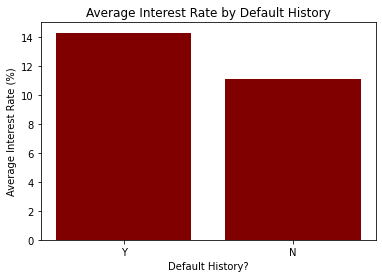

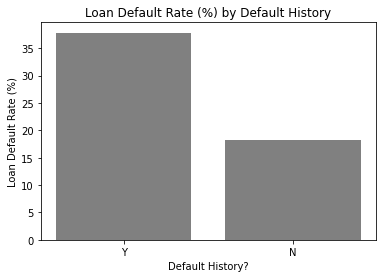

In [42]:
# Interest Rate
plt.bar(default_hist_freq['Default History?'], default_hist_freq['Average Interest Rate (%)'], color = 'maroon')
plt.xlabel('Default History?')
plt.ylabel('Average Interest Rate (%)')
plt.title ('Average Interest Rate by Default History')
plt.show();

# Default Rate
plt.bar(default_hist_freq['Default History?'], default_hist_freq['Loan Default Rate (%)'], color = 'grey')
plt.xlabel('Default History?')
plt.ylabel('Loan Default Rate (%)')
plt.title ('Loan Default Rate (%) by Default History')
plt.show();

## Summary & Business Implications

In general, we see that as loan interest rates and loan grade letters (A-G) increase, we see an increase in loan default rates across customer demographic. We also see a striking pattern for Income, Default History and Emplyment Category as individuals with income below the average in our data (\$56,000) accrue the most default rates across income groups (\~30%), while individuals with a credit bureau default history on file accrue TWO times as many default rates as those who do not. Finally we see that Entry Level (0-4 years) individuals accrued ~25% of default rates among Employment Categories.

GL Financial Stakeholders may especially be interested in monitoring the above factors closely when conducting future efforts towards decision making on who should be issued loan defaults, as well as monitor changes in the above factors over time.

## Next Steps - Variable Importance Analysis

The Analytics team of GL Financial would now look to build an engine to predict loan default and make recommendations for future loan marketing initiatives based on customer profiles. This analysis with visualizations was only part of the first sprint towards the stated solution. Stakeholders are now looking forward to seeing what the Analytics team comes up with (and so are you, I assume!)

In [43]:
# Export to CSV
CreditData.to_csv('credit_data_V2.csv', index = False)

# Sprint 2 - Variable Importance Analysis

## Sprint 2 Table of Contents

1. Objective
2. The Data
3. Recap of Sprint 1
4. Chi-Square Tests of Independence
    - Hypothesis Testing for chi-square significance
    - Cramer's V - Interpretation of Effect Size
    - Variable Association Strength
    - Strength of Association to Target Variable (loan_status)
5. Point Biserial Correlation
6. Summary & Business Implications
7. Next Steps - Prediction and Recommendations

## Sprint 2 Objective
Gringotts Financial, a hypothetical Lending and Financing company, would like to better understand customer tendencies to default on loans in their loan financing program.

In this Sprint, the Analytics team will be examining the importance of variables in relation to each other and to the target variable, `loan_status`. They will utilize statistical testing and effect size analyses to achieve this

## Sprint 1 Recap

In sprint 1, the GL Financial Analytics team produced an Exploratory Data Analysis report and found interesting insights about the loan default data. They utilized tables and charts to explore relationships between variables in the dataset. They defined a loan default rate metric and explored trends across various customer demographics against this metric. That was just the beginning, though. In this sprint, the Analytics team will be conducting a Variable Importance Analysis, particularly analyzing and quantifying the effects (if any) of various variables on each other and on the target variable `loan_status`

## Sprint 2 Approach

In [44]:
CreditData = pd.read_csv("credit_data_V2.csv")

In [45]:
loan_status_counts = [len(CreditData[CreditData['loan_status'] == 0]), 
 len(CreditData[CreditData['loan_status'] == 1])]
labels = ['No Default', 'Default']

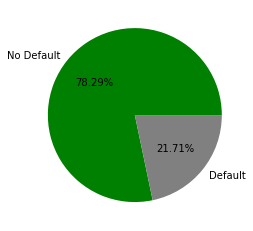

In [46]:
plt.pie(loan_status_counts, labels = labels, autopct='%.2f%%', colors = ['green', 'grey']);

In [47]:
# Percent of No Default needed to balance dataset
balancer = 21.71/78.29

In [48]:
loan_repay_sample1 = CreditData[CreditData['loan_status'] == 0].sample(frac = balancer)
loan_repay_sample1

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
53,26,277104,RENT,0.0,VENTURE,B,20000,11.48,0,0.07,N,3
17265,28,53000,RENT,6.0,DEBTCONSOLIDATION,B,3500,11.49,0,0.07,N,6
18640,29,46873,MORTGAGE,9.0,PERSONAL,A,11200,7.14,0,0.24,N,6
2832,22,36000,OWN,6.0,EDUCATION,B,7500,9.63,0,0.21,N,2
25117,27,120000,MORTGAGE,11.0,PERSONAL,A,7000,6.76,0,0.06,N,7
...,...,...,...,...,...,...,...,...,...,...,...,...
5041,23,22000,RENT,1.0,EDUCATION,C,5500,13.04,0,0.25,N,4
488,24,79000,RENT,8.0,HOMEIMPROVEMENT,A,21000,7.90,0,0.27,N,2
16809,35,21600,RENT,1.0,EDUCATION,C,2500,14.35,0,0.12,Y,8
26266,41,30000,RENT,3.0,MEDICAL,A,8875,5.42,0,0.30,N,15


In [49]:
# All loan defaults
loan_defaults = CreditData[CreditData['loan_status'] == 1]

In [50]:
# Check counts
print(len(loan_defaults), len(loan_repay_sample1))

6187 6186


In [51]:
balanced_creditdata1 = pd.concat([loan_repay_sample1, 
                                  loan_defaults], 
                                 axis = 0).reset_index(drop = True)
balanced_creditdata1

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,26,277104,RENT,0.0,VENTURE,B,20000,11.48,0,0.07,N,3
1,28,53000,RENT,6.0,DEBTCONSOLIDATION,B,3500,11.49,0,0.07,N,6
2,29,46873,MORTGAGE,9.0,PERSONAL,A,11200,7.14,0,0.24,N,6
3,22,36000,OWN,6.0,EDUCATION,B,7500,9.63,0,0.21,N,2
4,27,120000,MORTGAGE,11.0,PERSONAL,A,7000,6.76,0,0.06,N,7
...,...,...,...,...,...,...,...,...,...,...,...,...
12368,52,71520,RENT,0.0,EDUCATION,E,7000,16.82,1,0.10,Y,24
12369,57,40000,RENT,1.0,MEDICAL,A,15000,8.90,1,0.38,N,21
12370,60,45600,RENT,1.0,VENTURE,B,20000,10.00,1,0.44,N,26
12371,52,65004,RENT,4.0,PERSONAL,D,20000,15.58,1,0.31,Y,19


## Chi-Square Tests of Independence

We will perform a chi-square test of independence for the categorical variables in our dataset. This will be done in two ways:

1. Test for independence with each other
2. Test for independence with the target variable, `loan_status`

The aim of the first approach is to ensure minimal multicollinearity, similar to the correlation matrix approach for our numerical variables. The aim of the second approach is a preliminary check to validate the subsequent logistic regression. Both of these methods converge at helping us determine which features we should include in the final logistic regression.

### Store Categorical columns

In [52]:
categorical = ['loan_status',
               'person_home_ownership',
               'loan_intent',
               'loan_grade',
               'cb_person_default_on_file']

### Get Crosstabs

In [53]:
crosstabs = get_crosstabs(CreditData, categorical)

In [54]:
len(crosstabs)

25

There are 25 crosstabs, the first 5 (index 0 to 4) are for the target variable against itself and other categorical variables. The last 20 (index 5 to 25) are for every other variable against every other variable. Note, there are some repeated crosstabs with reversed rows and columns.

In [55]:
# Loan status vs. itself
crosstabs[0]

loan_status,0,1
loan_status,,
0,22308,0
1,0,6187


In [56]:
# Home ownership vs. Loan status
crosstabs[1]

person_home_ownership,MORTGAGE,OTHER,OWN,RENT
loan_status,,,,
0,10250,66,2029,9963
1,1483,27,145,4532


In [57]:
# Loan intent vs. Loan status
crosstabs[2]

loan_intent,DEBTCONSOLIDATION,EDUCATION,HOMEIMPROVEMENT,MEDICAL,PERSONAL,VENTURE
loan_status,,,,,,
0,3253,4701,2367,3851,3897,4239
1,1294,967,820,1418,960,728


In [58]:
# Loan grade vs. Loan status
crosstabs[3]

loan_grade,A,B,C,D,E,F,G
loan_status,,,,,,,
0,8446,7644,4525,1322,307,63,1
1,898,1448,1155,1920,562,146,58


In [59]:
# Default on file vs. Loan status
crosstabs[4]

cb_person_default_on_file,N,Y
loan_status,,
0,19144,3164
1,4262,1925


### Get Chi-square results

In [60]:
results = chi_square_results(crosstabs, CreditData)

In [61]:
len(results)

25

In [62]:
results

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_status,loan_status,28489.117334,0.000000e+00,1,1.000
loan_status,person_home_ownership,1638.819777,0.000000e+00,3,0.240
loan_status,loan_intent,464.249062,4.143295e-98,5,0.128
loan_status,loan_grade,5106.169140,0.000000e+00,6,0.423
loan_status,cb_person_default_on_file,945.263830,1.419949e-207,1,0.182
person_home_ownership,loan_status,1638.819777,0.000000e+00,3,0.240
person_home_ownership,person_home_ownership,85485.000000,0.000000e+00,9,1.000
person_home_ownership,loan_intent,639.384519,1.502915e-126,15,0.086
person_home_ownership,loan_grade,616.507923,2.780584e-119,18,0.085


## Hypothesis Testing for chi-square significance

Null Hypothesis: Variables are independent   
Alternative Hypothesis: Variables are dependent

### Filter by p-values, using alpha threshold of 0.0001 for extremely strong evidence

#### Rejecting the null

In [63]:
null_reject = results[results['p-value'] < 0.0001]

In [64]:
len(null_reject)

21

In [65]:
null_reject

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_status,loan_status,28489.117334,0.000000e+00,1,1.000
loan_status,person_home_ownership,1638.819777,0.000000e+00,3,0.240
loan_status,loan_intent,464.249062,4.143295e-98,5,0.128
loan_status,loan_grade,5106.169140,0.000000e+00,6,0.423
loan_status,cb_person_default_on_file,945.263830,1.419949e-207,1,0.182
person_home_ownership,loan_status,1638.819777,0.000000e+00,3,0.240
person_home_ownership,person_home_ownership,85485.000000,0.000000e+00,9,1.000
person_home_ownership,loan_intent,639.384519,1.502915e-126,15,0.086
person_home_ownership,loan_grade,616.507923,2.780584e-119,18,0.085


There is extremely strong evidence that many variables in our dataset depend on each other to some degree. While this is the case, it does not imply a high level of multicollinearity. To determine this, we calculated the Cramer's V correlation coefficient for each of the relationships. This column is labelled `cramers_v`

#### Failing to reject the null

In [66]:
null_ftr = results[results['p-value'] >= 0.0001]

In [67]:
len(null_ftr)

4

In [68]:
null_ftr # slicing first two rows due because the other 2 are duplicates

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_intent,loan_grade,65.125752,0.000211,30,0.021
loan_intent,cb_person_default_on_file,7.046167,0.217229,5,0.016
loan_grade,loan_intent,65.125752,0.000211,30,0.021
cb_person_default_on_file,loan_intent,7.046167,0.217229,5,0.016


There is extremely strong evidence in our data that a person's loan grade and default history neither depend on nor influence their loan intent. 

The Cramer's V correlation coefficient also confirms this, as these relationships have the smallest correlation coefficient out of all other relationships.

### Cramer's V - Interpretation of Effect Size

According to IBM's interpretation of Cramer's V effect size (ES),

ES ≤ 0.2 implies a weak association,

0.2 < ES ≤ 0.6 implies a moderate association, and

ES > 0.6 implies a strong association.

**Source**: https://www.ibm.com/docs/en/cognos-analytics/11.1.0?topic=terms-cramrs-v

### Variable Association Strength

In [69]:
weak = results[results['cramers_v'] <= 0.2]

In [70]:
weak

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_status,loan_intent,464.249062,4.143295e-98,5,0.128
loan_status,cb_person_default_on_file,945.263830,1.419949e-207,1,0.182
person_home_ownership,loan_intent,639.384519,1.502915e-126,15,0.086
person_home_ownership,loan_grade,616.507923,2.780584e-119,18,0.085
person_home_ownership,cb_person_default_on_file,115.199677,8.338650e-25,3,0.064
loan_intent,loan_status,464.249062,4.143295e-98,5,0.128
loan_intent,person_home_ownership,639.384519,1.502915e-126,15,0.086
loan_intent,loan_grade,65.125752,2.113675e-04,30,0.021
loan_intent,cb_person_default_on_file,7.046167,2.172294e-01,5,0.016


In [71]:
moderate = results[(results['cramers_v'] > 0.2) & (results['cramers_v'] <= 0.6)]

In [72]:
moderate

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_status,person_home_ownership,1638.819777,0.0,3,0.240
loan_status,loan_grade,5106.169140,0.0,6,0.423
person_home_ownership,loan_status,1638.819777,0.0,3,0.240
loan_grade,loan_status,5106.169140,0.0,6,0.423


In [73]:
strong = results[results['cramers_v'] > 0.6]

In [74]:
strong

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_status,loan_status,28489.117334,0.0,1,1.000
person_home_ownership,person_home_ownership,85485.000000,0.0,9,1.000
loan_intent,loan_intent,142475.000000,0.0,25,1.000
loan_grade,loan_grade,170970.000000,0.0,36,1.000
loan_grade,cb_person_default_on_file,11369.660967,0.0,6,0.632
cb_person_default_on_file,loan_grade,11369.660967,0.0,6,0.632
cb_person_default_on_file,cb_person_default_on_file,28488.183653,0.0,1,1.000


### Strength of Association to Target Variable (loan_status)

In [75]:
loan_status_results = results[:5].sort_values(by = 'cramers_v', ascending = False)
loan_status_results

,Column Name,Test statistic,p-value,df,cramers_v
Row name,,,,,
loan_status,loan_status,28489.117334,0.000000e+00,1,1.000
loan_status,loan_grade,5106.169140,0.000000e+00,6,0.423
loan_status,person_home_ownership,1638.819777,0.000000e+00,3,0.240
loan_status,cb_person_default_on_file,945.263830,1.419949e-207,1,0.182
loan_status,loan_intent,464.249062,4.143295e-98,5,0.128


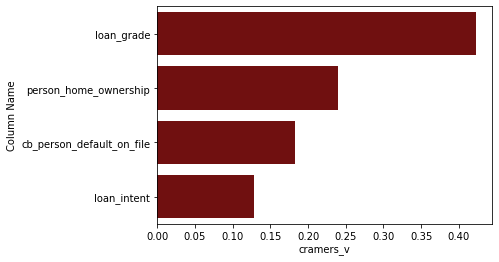

In [76]:
sns.barplot(x="cramers_v", 
            y="Column Name", 
            data=loan_status_results[1:], 
            color="maroon")

plt.show();

From the above graph, we can see that although there is some association between a person's default history (`cb_person_default_on_file`) and `loan_status`, it is not as strong as our original visualization of default rates vs. default history suggested. 

## Point Biserial Correlation

Point Biserial correlation finds relationships between binary categorical and continuous variables. In this section we will use this correlation

In [77]:
numerical = ['person_age',
             'person_income',
             'person_emp_length',
             'loan_amnt',
             'loan_int_rate',
             'loan_percent_income',
             'cb_person_cred_hist_length']


In [78]:
pbr_results = get_pbr_result(CreditData, numerical, "loan_status").sort_values(by = 'Absolute Point biserial R', 
                                                                 ascending = False)
pbr_results

,Continuous Variable,Binomial Target Variable,Point biserial R,Absolute Point biserial R,p-value
5,loan_percent_income,loan_status,0.379845,0.379845,0.000000e+00
4,loan_int_rate,loan_status,0.339952,0.339952,0.000000e+00
1,person_income,loan_status,-0.167803,0.167803,5.381495e-179
3,loan_amnt,loan_status,0.113965,0.113965,5.377688e-83
2,person_emp_length,loan_status,-0.086718,0.086718,1.074962e-48
0,person_age,loan_status,-0.023267,0.023267,8.567163e-05
6,cb_person_cred_hist_length,loan_status,-0.016485,0.016485,5.389510e-03


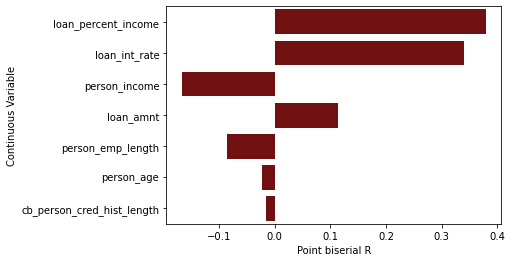

In [79]:
sns.barplot(x="Point biserial R", 
            y="Continuous Variable", 
            data=pbr_results, 
            color="maroon")

plt.show();

# Next Steps - Prediction

In this section, we use statistical methods to determine the most important and least important variables with respect to each other and to the target variable, `loan_status`. In the next session, we will utilize machine learning methods to predict which customer profiles are likely to default on and repay loans. We will also incorporate a machine learning approach to variable importance and compare to the statistical approach, helping to better rank the umportant variables.

## Sprint 3 Table of Contents

1. Objective
2. The Data
3. Library & Function Organization
    - Libraries
    - Functions
4. Project Approach
    - Recap of Sprints 1 & 2
    - Data Preprocessing
        - Dummy Variables
        - Train-Test Split
    - Logistic Regression
        - Feature Scaling
        - Model Training
        - Model Results
        - Model Explainability
5. Summary & Business Implications
6. Conclusions

## Sprint 3 Objective
Gringotts Financial, a hypothetical Lending and Financing company, would like to better understand customer tendencies to default on loans in their loan financing program.

In this Sprint, the Analytics team will utilize machine learning methods to predict which customer profiles are likely to default on and repay loans. We will also incorporate a machine learning approach to variable importance and compare to the statistical approach, helping to better rank the important variables

Stakeholders are interested in predicting customers that will default on their loans and understanding their profiles.

## Sprint 3 Approach

In [80]:
CreditData = pd.read_csv("credit_data_V2.csv")

In [81]:
CreditData.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
1,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
2,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
3,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
4,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


## Data Pre-processing

In [82]:
y = CreditData['loan_status']
X = CreditData.drop(['loan_status'], axis = 1)

### Dummy Variables

In [83]:
X = pd.get_dummies(X)

In [84]:
X.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
0,21,9600,5.0,1000,11.14,0.10,2,0,0,1,...,0,0,1,0,0,0,0,0,1,0
1,25,9600,1.0,5500,12.87,0.57,3,1,0,0,...,0,0,0,1,0,0,0,0,1,0
2,23,65500,4.0,35000,15.23,0.53,2,0,0,0,...,0,0,0,1,0,0,0,0,1,0
3,24,54400,8.0,35000,14.27,0.55,4,0,0,0,...,0,0,0,1,0,0,0,0,0,1
4,21,9900,2.0,2500,7.14,0.25,2,0,0,1,...,1,1,0,0,0,0,0,0,1,0


### Train-Test Split

In [85]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size = 0.25)

In [86]:
X_train.shape, X_test.shape

((21371, 26), (7124, 26))

### Feature Scaling

In [87]:
X_train.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
count,21371.000000,2.137100e+04,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,...,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000,21371.000000
mean,27.726124,6.651443e+04,4.778204,9633.083384,11.036960,0.169185,5.797763,0.412475,0.003416,0.076318,...,0.175939,0.328483,0.319405,0.199195,0.113893,0.030462,0.006691,0.001872,0.820083,0.179917
std,6.189482,5.285318e+04,4.031780,6314.503021,3.228839,0.106344,4.049807,0.492291,0.058347,0.265513,...,0.380777,0.469672,0.466257,0.399404,0.317688,0.171858,0.081528,0.043224,0.384127,0.384127
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,3.960000e+04,2.000000,5000.000000,7.900000,0.090000,3.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,26.000000,5.572800e+04,4.000000,8000.000000,10.990000,0.150000,4.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,30.000000,8.000000e+04,7.000000,12462.500000,13.475000,0.230000,8.000000,1.000000,0.000000,0.000000,...,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,84.000000,2.039784e+06,38.000000,35000.000000,23.220000,0.830000,30.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Logistic Regression

### Model Training

In [88]:
# Instantiate the logistic regression model

# specify liblinear optimization solver to support both L1 and L2 regularization
logitmodel = LogisticRegression(solver = 'liblinear', random_state = 0)

# fit the model
logitmodel.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [89]:
logitmodel.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 0,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [90]:
# Predict

y_pred_test = logitmodel.predict(X_test)
y_pred_test

array([0, 0, 0, ..., 0, 0, 0])

### Model Results

In [91]:
# Test Accuracy
round(accuracy_score(y_test, y_pred_test), 4)

0.8119

In [92]:
# Train Accuracy
y_pred_train = logitmodel.predict(X_train)
round(accuracy_score(y_train, y_pred_train), 4)

0.818

In [93]:
pd.Series(y_pred_test)

0       0
1       0
2       0
3       0
4       0
       ..
7119    0
7120    0
7121    0
7122    0
7123    0
Length: 7124, dtype: int64

In [94]:
y_test

15776    1
26003    0
2603     0
16462    1
23751    1
        ..
2513     0
26934    0
6573     1
23908    1
11948    0
Name: loan_status, Length: 7124, dtype: int64

In [95]:
logitmodel.predict_proba(X_test)

array([[0.99614485, 0.00385515],
       [0.87815295, 0.12184705],
       [0.80685374, 0.19314626],
       ...,
       [0.57151143, 0.42848857],
       [0.61423466, 0.38576534],
       [0.97816176, 0.02183824]])

## Decision Tree

In [96]:
dt = DecisionTreeClassifier(criterion = "gini", splitter = "best", max_depth = 5)

In [97]:
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

In [98]:
dt_y_pred_test = dt.predict(X_test)

In [99]:
# Decision Tree Train Accuracy
dt_y_pred_train = dt.predict(X_train)
round(accuracy_score(y_train, dt_y_pred_train), 4)

0.9089

In [100]:
# Decision Tree Test Accuracy
round(accuracy_score(y_test, dt_y_pred_test), 4)

0.9089

In [101]:
fig, axes = plt.subplots(nrows = 1,
                         ncols = 1,
                         figsize = (80,30), 
                         dpi=500)
plot_tree(dt, 
          filled =True, 
          fontsize = 25, 
          feature_names = X.columns, 
          class_names = True)

fig.savefig('Decision_Tree_Plot_Final.png')

### Model Metrics

In [102]:
cm = confusion_matrix(y_test, dt_y_pred_test)
cm

array([[5514,   41],
       [ 608,  961]])

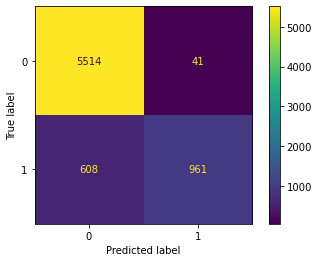

In [103]:
ConfusionMatrixDisplay(confusion_matrix = cm).plot();

In [104]:
cr = classification_report(y_test, dt_y_pred_test)
print(cr)

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      5555
           1       0.96      0.61      0.75      1569

    accuracy                           0.91      7124
   macro avg       0.93      0.80      0.85      7124
weighted avg       0.91      0.91      0.90      7124



## Feature Importance - A Machine Learning Approach

### Mean Impurity method

Feature importance is calculated by taking an average of the decrease in impurity for all splits in all decision trees in the random forest.

A decrease in impurity is accompanied by an increase in information gain in favor of a given class.

In [105]:
dt.feature_importances_

array([0.        , 0.0826348 , 0.03431499, 0.        , 0.21563489,
       0.3554113 , 0.        , 0.        , 0.00227286, 0.00347172,
       0.19958029, 0.03998177, 0.        , 0.00105214, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.03059033,
       0.03505492, 0.        , 0.        , 0.        , 0.        ,
       0.        ])

In [106]:
feature_importance = pd.DataFrame(dt.feature_importances_, index = X.columns, columns = ['Importance Score'])

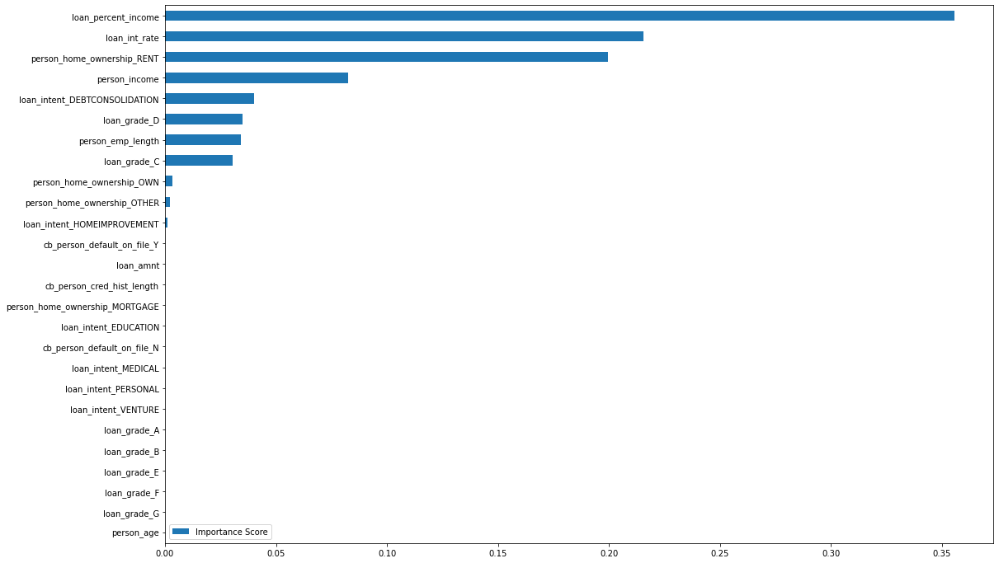

In [107]:
feature_importance.sort_values(by = 'Importance Score', ascending = True).plot.barh(figsize = (18,12))

plt.show()

### Permutation Importance Method

In [108]:
result = permutation_importance(dt, 
                       X_test, 
                       y_test, 
                       n_repeats = 5)

In [109]:
dt_importances = pd.DataFrame(result.importances_mean, 
                               index=X.columns, 
                               columns = ['Importance Score'])

In [110]:
dt_importances['Variables'] = dt_importances.index

In [111]:
dt_importances = dt_importances.sort_values(by = 'Importance Score', ascending = False)

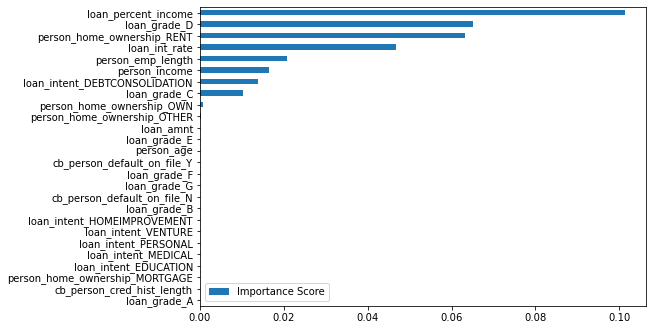

In [112]:
dt_importances.sort_values(by = 'Importance Score', ascending = True).plot.barh(figsize = (8,5.5))

plt.show()

# Overall Summary & Business Implications

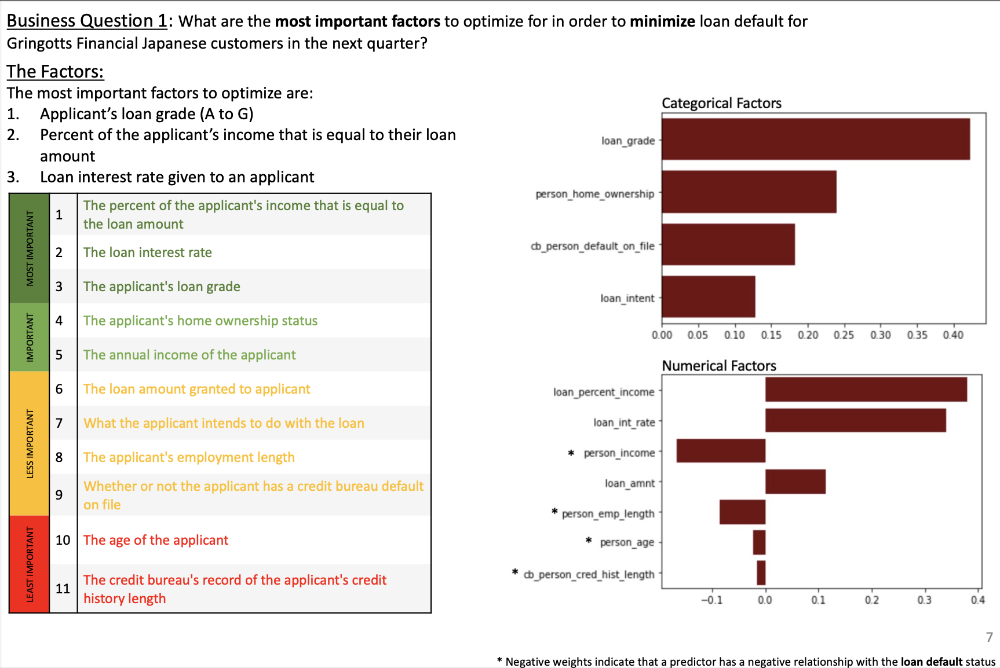

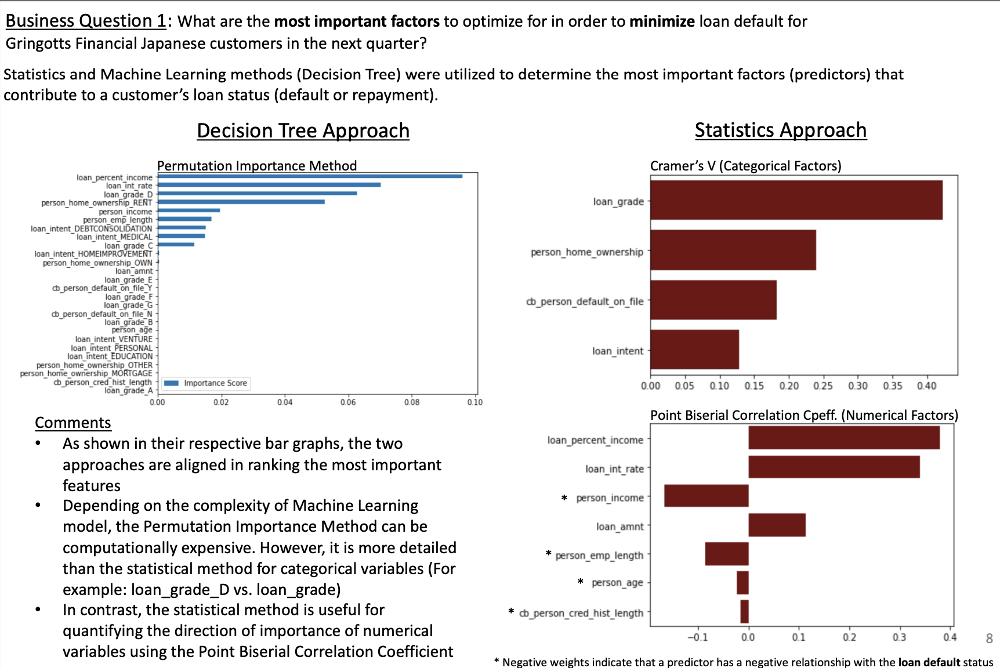

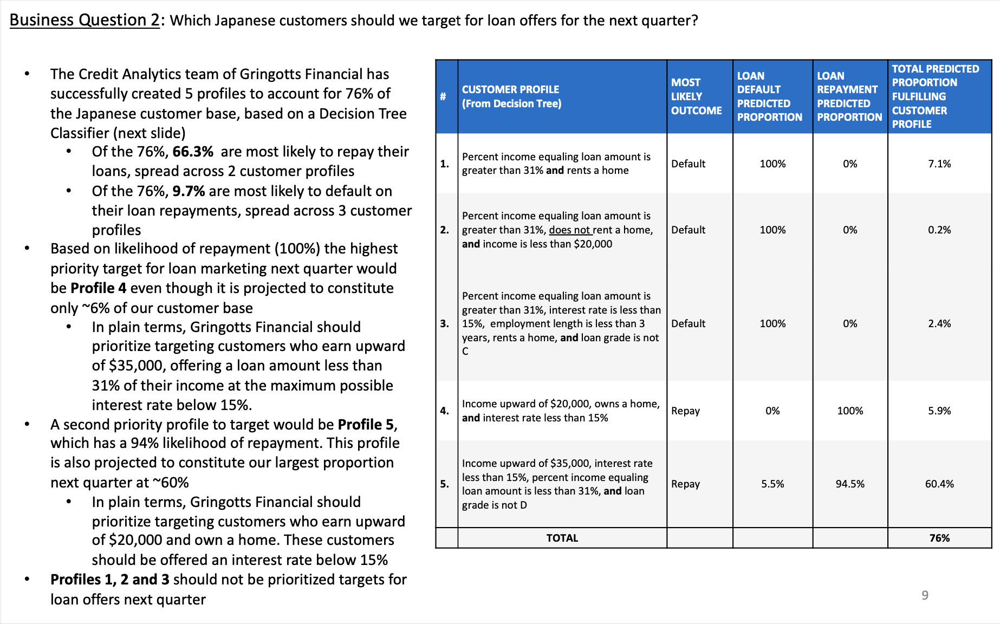

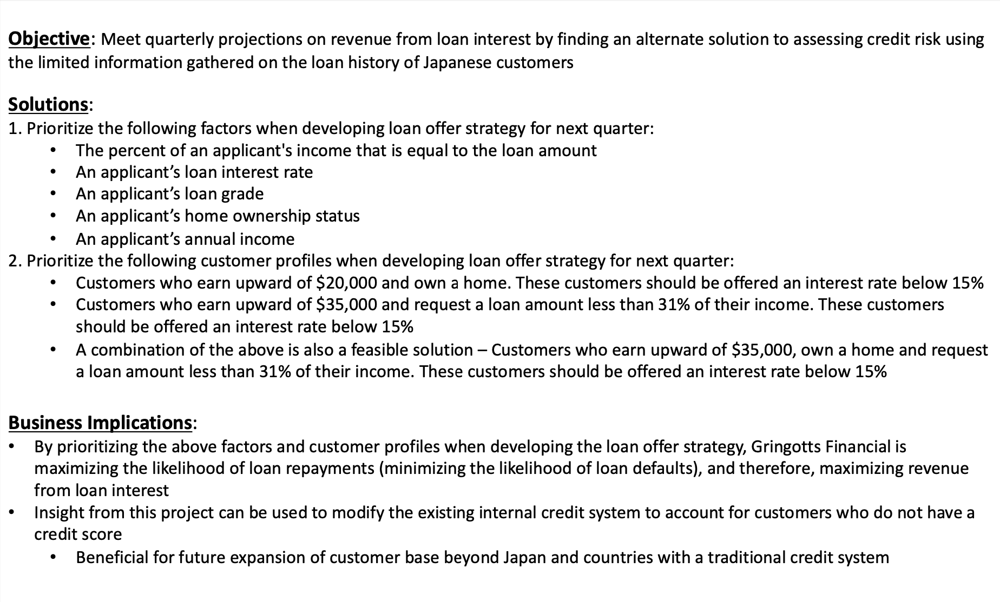